*Please run all the cells sequentially.

*All of this work has been done on Google Colab. So, please run it from Google Colab

In [ ]:
# Check if GPU is enabled.
!nvidia-smi
!lscpu |grep 'Model name'

Sat Apr 30 08:26:52 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla K80           Off  | 00000000:00:04.0 Off |                    0 |
| N/A   34C    P8    25W / 149W |      0MiB / 11441MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

# **Uploading code from Google Drive**

In [ ]:
# https://drive.google.com/file/d/1PgegjqOwaPAII3HfUaZyUFX6K8xVe5EG/view?usp=sharing
!pip install gdown -q
!gdown --id 1PgegjqOwaPAII3HfUaZyUFX6K8xVe5EG
!unzip -q inputs.zip
!rm -rf inputs.zip
!ls

/usr/local/lib/python3.7/dist-packages/gdown/cli.py:131: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  category=FutureWarning,
Downloading...
From: https://drive.google.com/uc?id=1PgegjqOwaPAII3HfUaZyUFX6K8xVe5EG
To: /content/inputs.zip
100% 875M/875M [00:03<00:00, 226MB/s]
inputs	sample_data


# **Importing all required libraries**

In [ ]:
import cv2
from PIL import Image
import os
import sys
import random
import warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from tqdm import tqdm
from itertools import chain
from skimage.io import imread, imshow, imread_collection, concatenate_images
from skimage.transform import resize
from skimage.morphology import label

from keras.models import Model, load_model
from keras.layers import Input
from keras.layers.core import Dropout, Lambda
from keras.layers.convolutional import Conv2D, Conv2DTranspose
from keras.layers.pooling import MaxPooling2D
from keras.layers.merge import concatenate
from keras.callbacks import EarlyStopping, ModelCheckpoint
from keras import backend as K
from keras.metrics import MeanIoU

from keras.utils.np_utils import normalize
from keras.utils.np_utils import to_categorical

import tensorflow as tf

from sklearn.model_selection import train_test_split
from sklearn.metrics import f1_score

# Please incude the "simple_multi_unet_model.py" from the given files into the home directory of this folder.
from simple_multi_unet_model import multi_unet_model

# **Defining image sizes**

In [ ]:
IMG_HEIGHT = 256
IMG_WIDTH = 256
IMG_CHANNELS = 3
n_classes=2

DATASET = "ISIC2018_Task1-2_Training_Input"
TRAIN_PATH="./inputs/" + DATASET + "/"

# **Reading images and masks**

In [ ]:
np.random.seed(10)

county=0
no_images = len(os.listdir(TRAIN_PATH+str("images/")))

X = np.zeros((no_images, IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS), dtype=np.uint8)
Y = np.zeros((no_images, IMG_HEIGHT, IMG_WIDTH), dtype=np.uint8)
mask = np.zeros((IMG_HEIGHT, IMG_WIDTH), dtype=np.uint8)

index=0
for img in os.listdir(TRAIN_PATH + str("images/")):
    im=cv2.imread(TRAIN_PATH + str("images/")+img)
    im = cv2.resize(im, (IMG_HEIGHT, IMG_WIDTH), interpolation = cv2.INTER_NEAREST)
    X[index]=im
    index = index + 1

index=0
for img in os.listdir(TRAIN_PATH+str("masks/0/")):
    im=cv2.imread(TRAIN_PATH+str("masks/0/")+img)
    im = cv2.cvtColor(im, cv2.COLOR_BGR2GRAY)
    im = cv2.resize(im, (IMG_HEIGHT, IMG_WIDTH), interpolation = cv2.INTER_NEAREST)
    im=np.divide(im,np.amax(im))
    
    Y[index]=im
    # print("mask shape = ", im.shape)
    # print("unique set = ", np.unique(im))
    index = index + 1

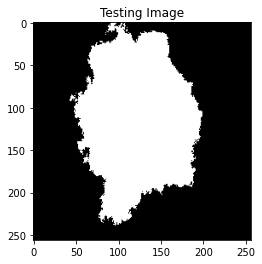

In [ ]:
  plt.title('Testing Image')
  plt.imshow(Y[3],'gray')

In [ ]:
print(np.unique(np.array(Y[0])))

[0 1]


In [ ]:
print("X shape = ", X.shape)
print("Y shape = ", Y.shape)

x_train, x_test, y_train, y_test = train_test_split(X, Y, test_size = 0.20, random_state = 0)

print("x_train shape = ", x_train.shape," y_train shape = ", y_train.shape)
print(" x_test shape = ", x_test.shape,"y_test shape = ", y_test.shape)
print("Class values in the dataset are ... ", np.unique(y_train))


# using categorical or one hot encoding for each class
y_train_mask_categorical = to_categorical(y_train, num_classes=n_classes)
print("y_train categorical shape = ",y_train_mask_categorical.shape)

# know let's use one hot encoding for test data
y_test_mask_categorical = to_categorical(y_test, num_classes=n_classes)
print("y_test categorical shape = ",y_test_mask_categorical.shape)

X shape =  (2594, 256, 256, 3)
Y shape =  (2594, 256, 256)
x_train shape =  (2075, 256, 256, 3)  y_train shape =  (2075, 256, 256)
 x_test shape =  (519, 256, 256, 3) y_test shape =  (519, 256, 256)
Class values in the dataset are ...  [0 1]
y_train categorical shape =  (2075, 256, 256, 2)
y_test categorical shape =  (519, 256, 256, 2)


# **Instantiating the model**

In [ ]:
def get_model():
    return multi_unet_model(n_classes=n_classes, IMG_HEIGHT=IMG_HEIGHT, IMG_WIDTH=IMG_WIDTH, IMG_CHANNELS=3)

model = get_model()
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 256, 256, 16  448         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 dropout (Dropout)              (None, 256, 256, 16  0           ['conv2d[0][0]']                 
                                )                                                             

# **Fitting and saving the model**

In [ ]:
history = model.fit(x_train, y_train_mask_categorical, 
                    batch_size = 8, 
                    verbose=1, 
                    epochs=100,
                    validation_data=(x_test, y_test_mask_categorical), 
                    #class_weight=class_weights,
                    shuffle=False)
                    
model.save('unet_trained_model_100_256_256'+DATASET+'.hdf5')
_, acc = model.evaluate(x_test,y_test_mask_categorical)
print("Accuracy is = ",(acc * 100.0),"%")

# **Loading the weights**

In [ ]:
model.load_weights('unet_trained_model_100_256_256'+DATASET+'.hdf5')
_, acc = model.evaluate(x_test,y_test_mask_categorical)
print("Accuracy is = ",(acc * 100.0),"%")

17/17 [==============================] - 4s 210ms/step - loss: 0.4054 - accuracy: 0.8222
Accuracy is =  82.22473859786987 %


In [ ]:
y_pred=model.predict(x_test)
y_pred_argmax=np.argmax(y_pred, axis=3)

# **Testing the trained model over test images**

(130, 256, 256)
(130, 256, 256)
Mean IoU = 0.9076126
F1 Score = 0.88197168025362
[[7733645.   69220.]
 [  62824.  653991.]]
IoU for class1 is:  0.98321265
IoU for class2 is:  0.8320126
(1, 256, 256)
index:  0


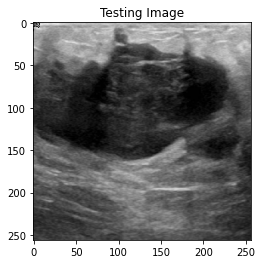

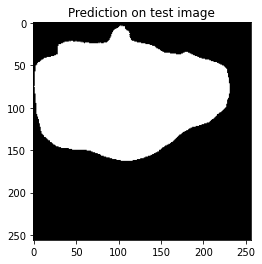

(1, 256, 256)
index:  1


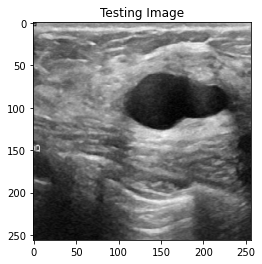

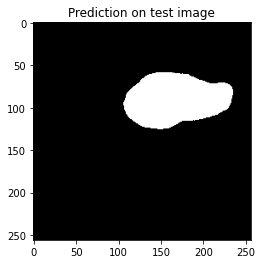

(1, 256, 256)
index:  2


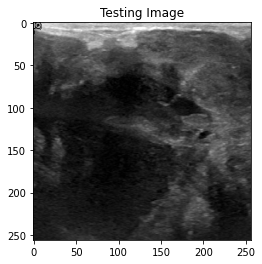

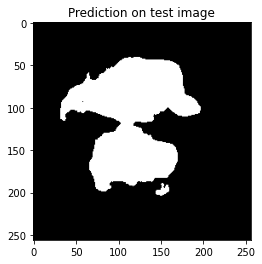

(1, 256, 256)
index:  3


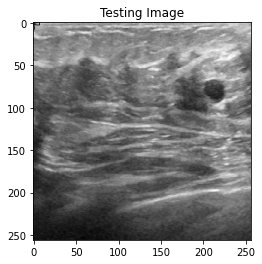

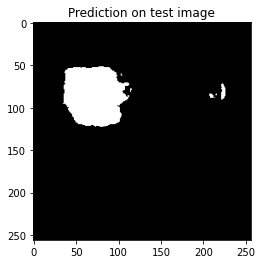

(1, 256, 256)
index:  4


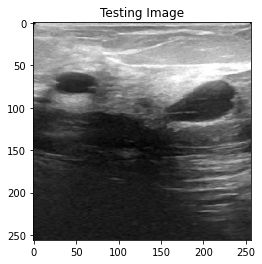

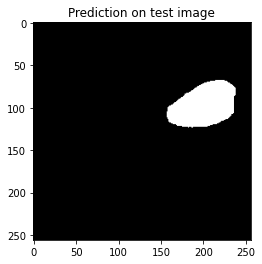

(1, 256, 256)
index:  5


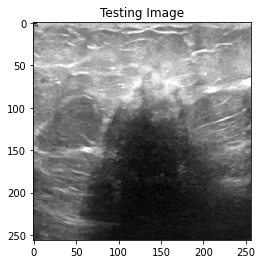

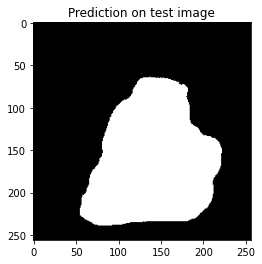

(1, 256, 256)
index:  6


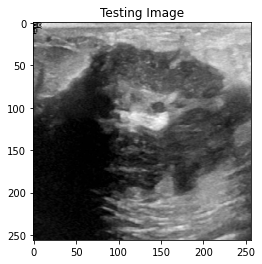

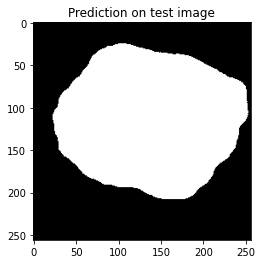

(1, 256, 256)
index:  7


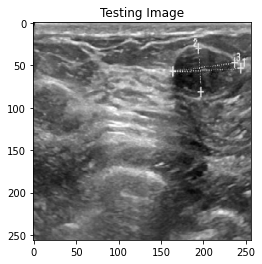

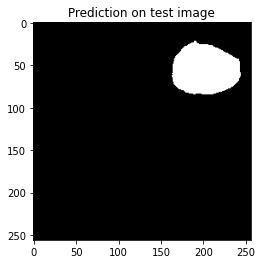

(1, 256, 256)
index:  8


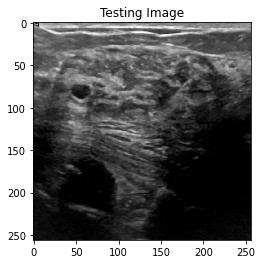

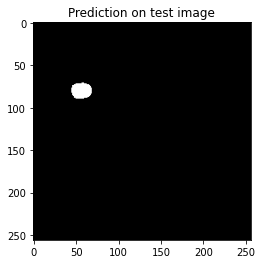

(1, 256, 256)
index:  9


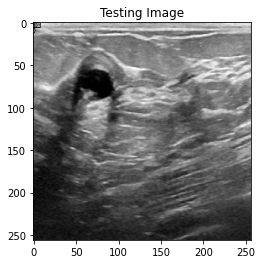

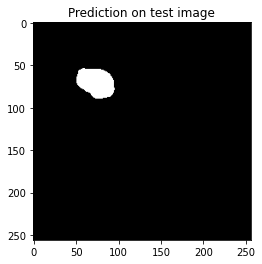

(1, 256, 256)
index:  10


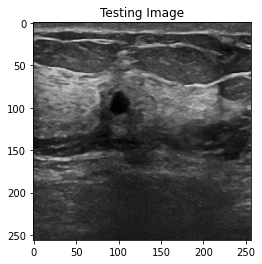

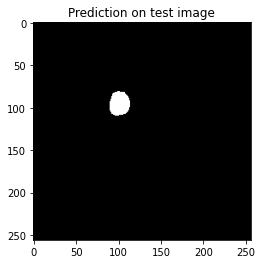

(1, 256, 256)
index:  11


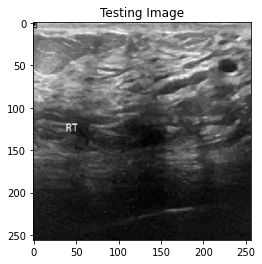

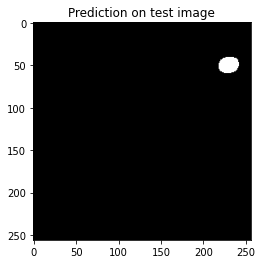

(1, 256, 256)
index:  12


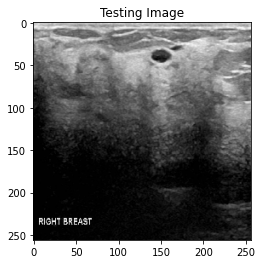

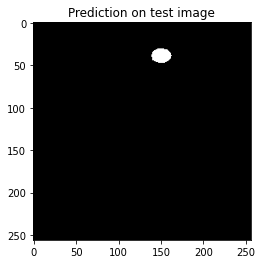

(1, 256, 256)
index:  13


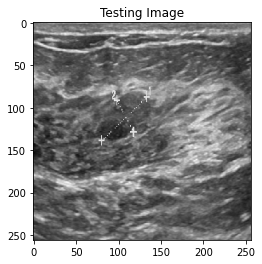

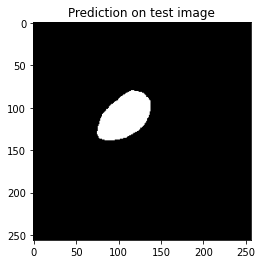

(1, 256, 256)
index:  14


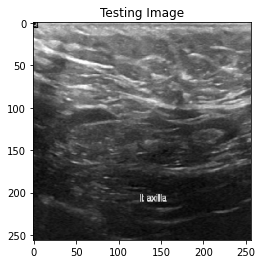

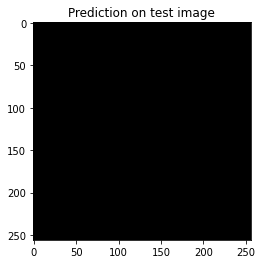

(1, 256, 256)
index:  15


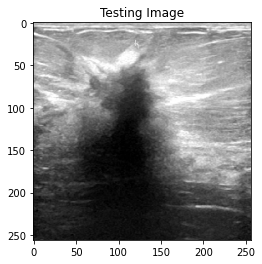

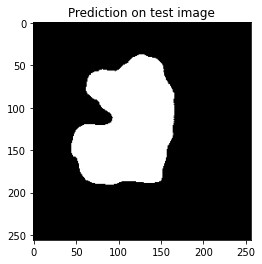

(1, 256, 256)
index:  16


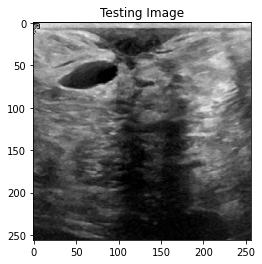

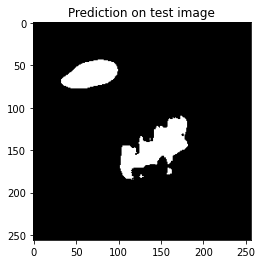

(1, 256, 256)
index:  17


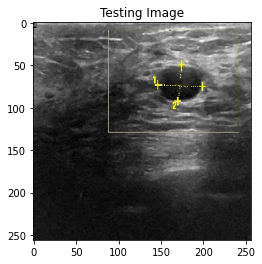

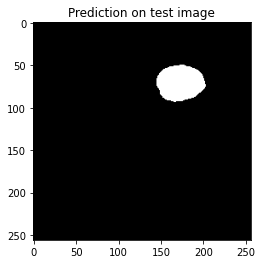

(1, 256, 256)
index:  18


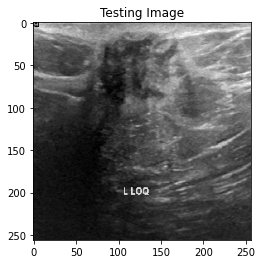

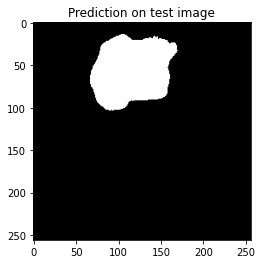

(1, 256, 256)
index:  19


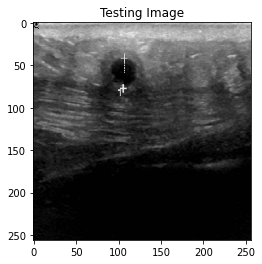

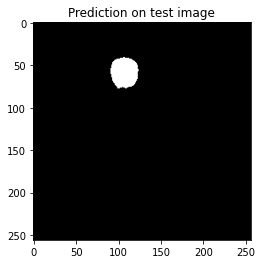

(1, 256, 256)
index:  20


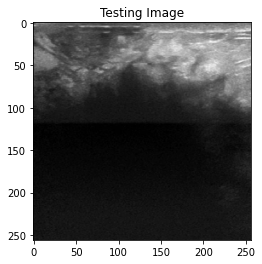

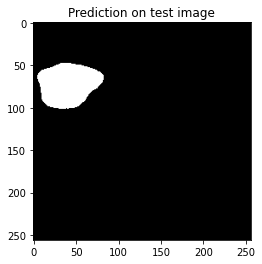

(1, 256, 256)
index:  21


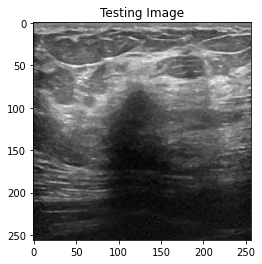

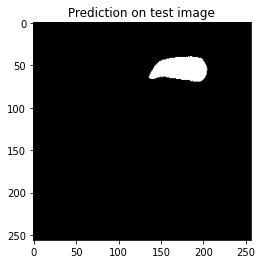

(1, 256, 256)
index:  22


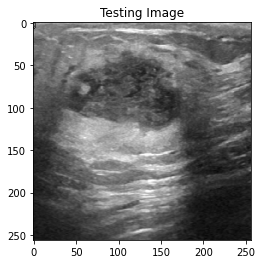

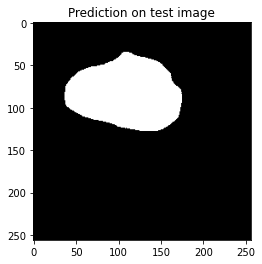

(1, 256, 256)
index:  23


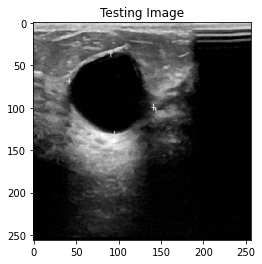

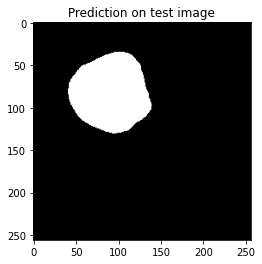

(1, 256, 256)
index:  24


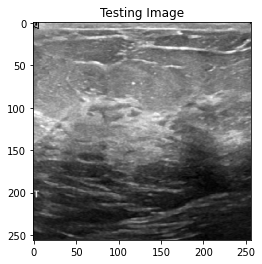

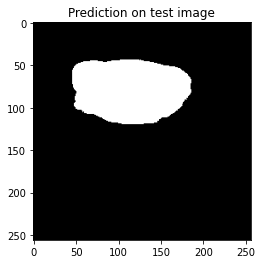

(1, 256, 256)
index:  25


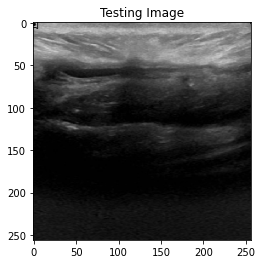

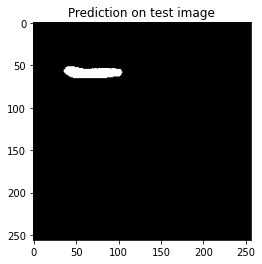

(1, 256, 256)
index:  26


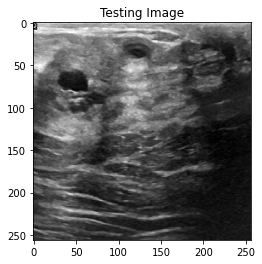

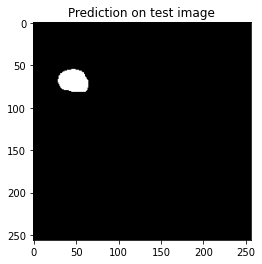

(1, 256, 256)
index:  27


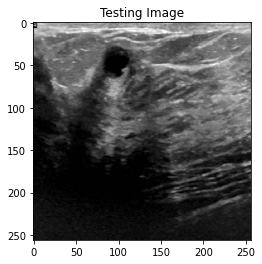

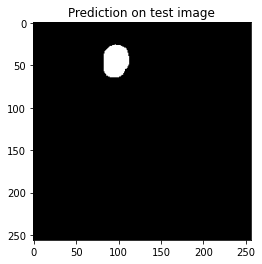

(1, 256, 256)
index:  28


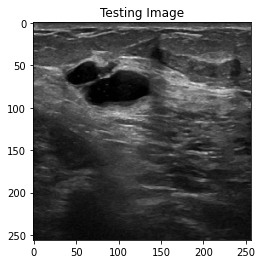

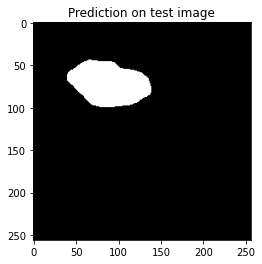

(1, 256, 256)
index:  29


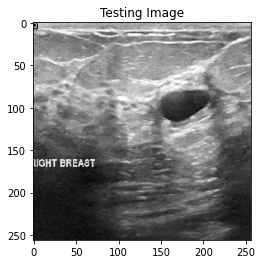

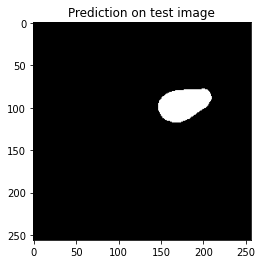

(1, 256, 256)
index:  30


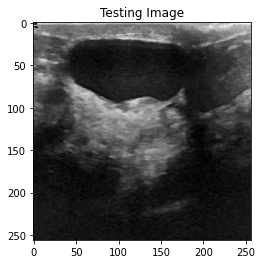

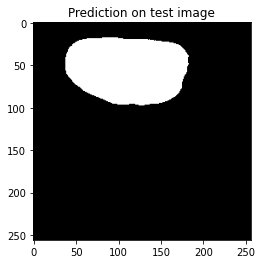

(1, 256, 256)
index:  31


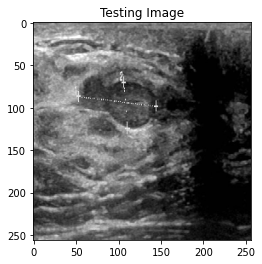

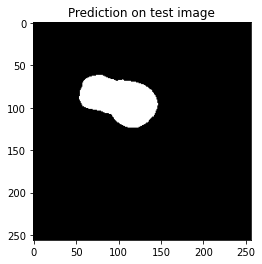

(1, 256, 256)
index:  32


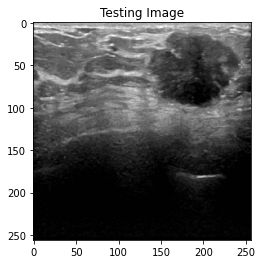

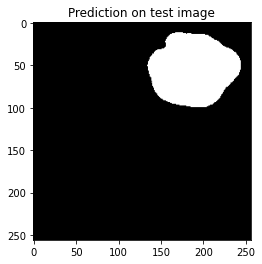

(1, 256, 256)
index:  33


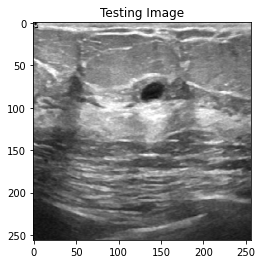

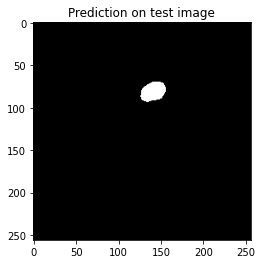

(1, 256, 256)
index:  34


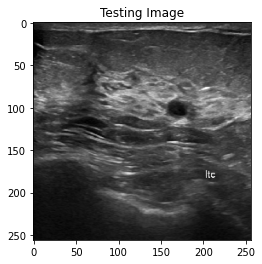

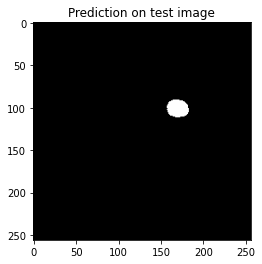

(1, 256, 256)
index:  35


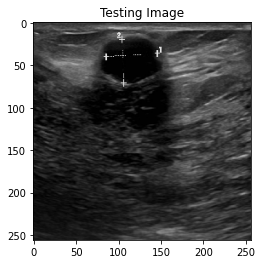

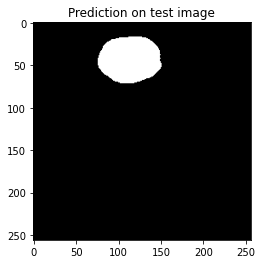

(1, 256, 256)
index:  36


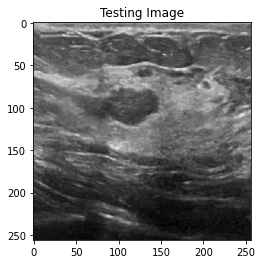

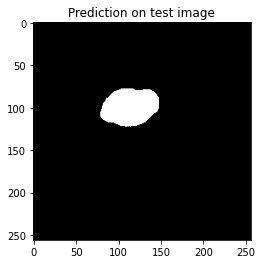

(1, 256, 256)
index:  37


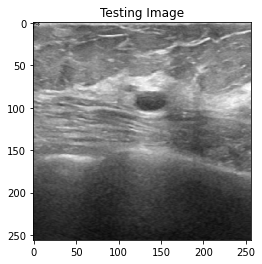

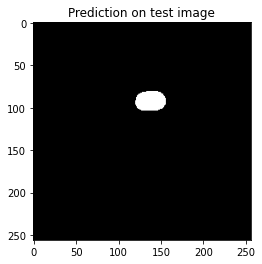

(1, 256, 256)
index:  38


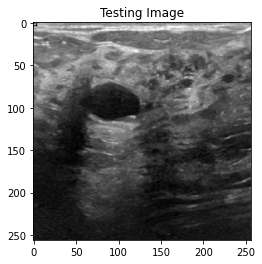

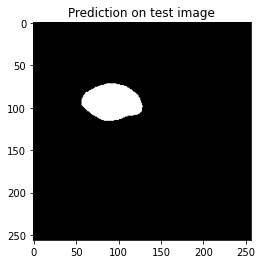

(1, 256, 256)
index:  39


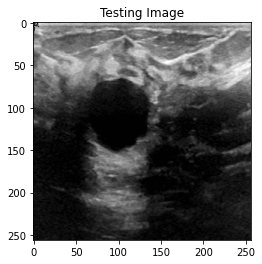

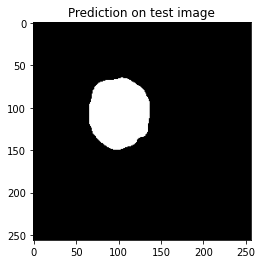

(1, 256, 256)
index:  40


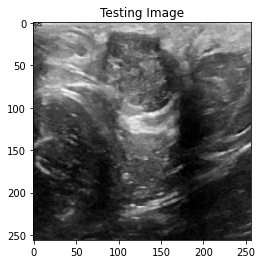

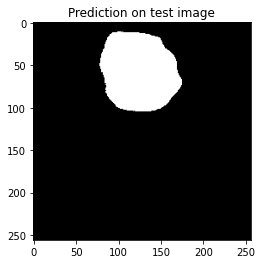

(1, 256, 256)
index:  41


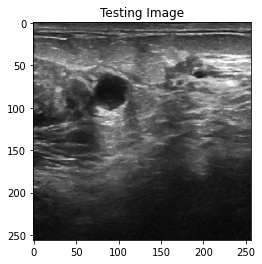

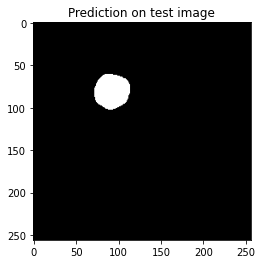

(1, 256, 256)
index:  42


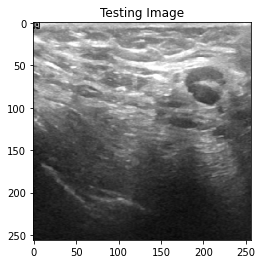

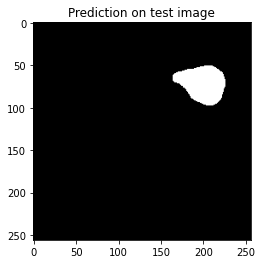

(1, 256, 256)
index:  43


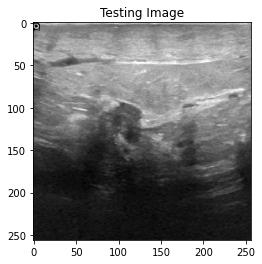

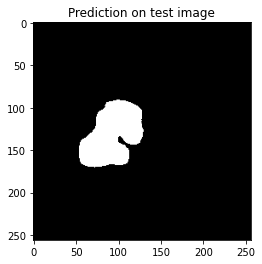

(1, 256, 256)
index:  44


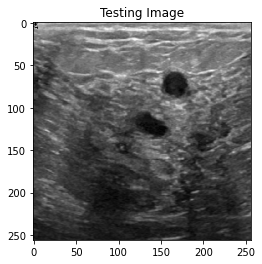

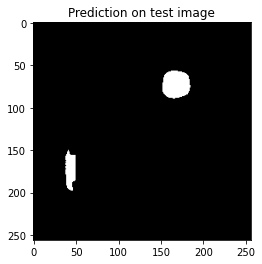

(1, 256, 256)
index:  45


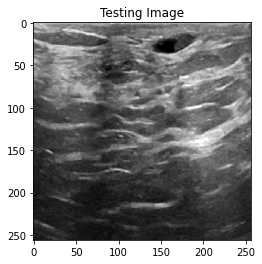

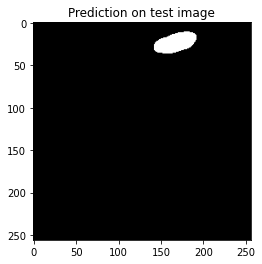

(1, 256, 256)
index:  46


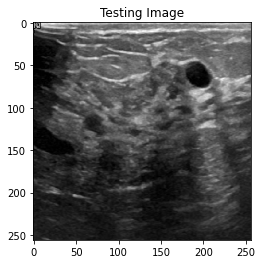

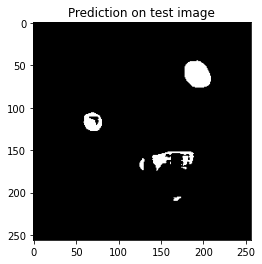

(1, 256, 256)
index:  47


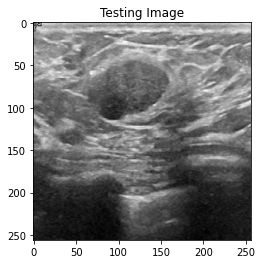

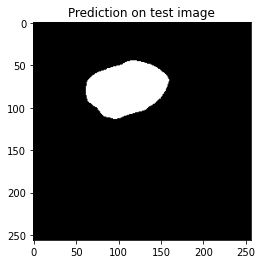

(1, 256, 256)
index:  48


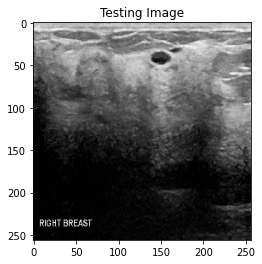

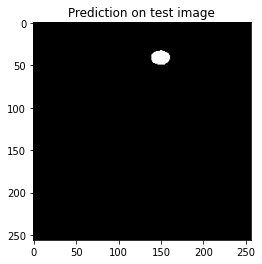

(1, 256, 256)
index:  49


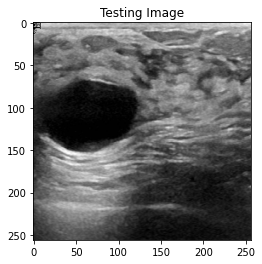

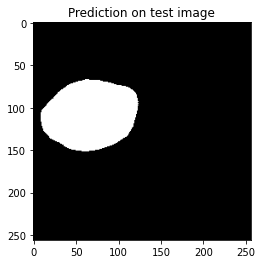

(1, 256, 256)
index:  50


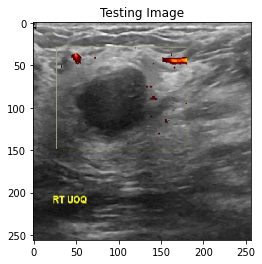

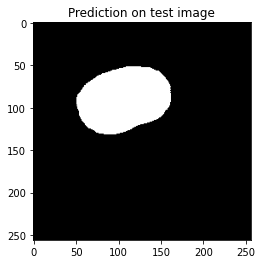

(1, 256, 256)
index:  51


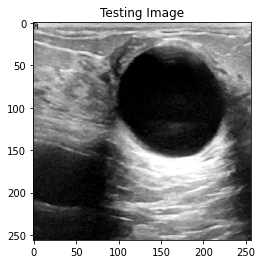

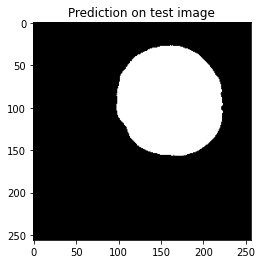

(1, 256, 256)
index:  52


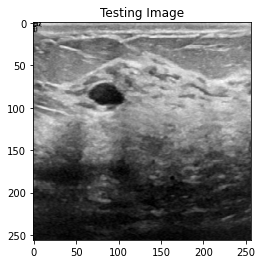

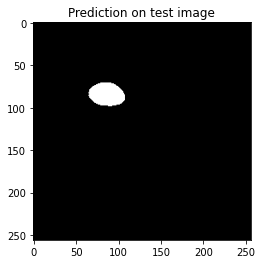

(1, 256, 256)
index:  53


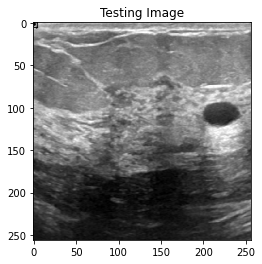

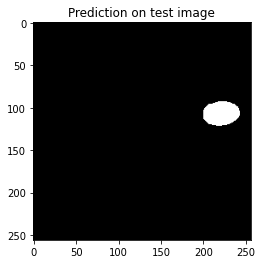

(1, 256, 256)
index:  54


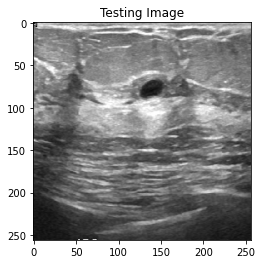

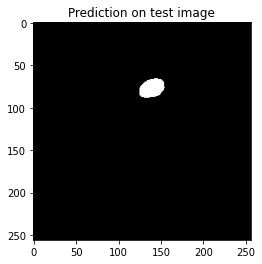

(1, 256, 256)
index:  55


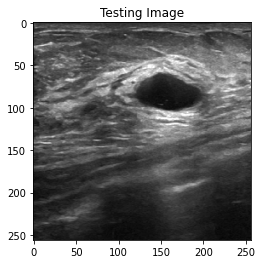

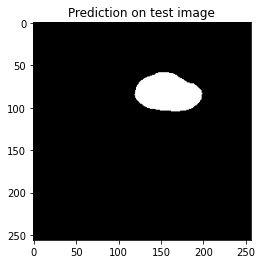

(1, 256, 256)
index:  56


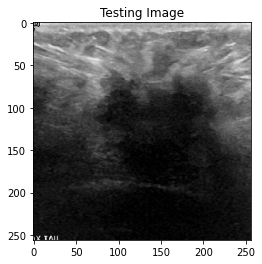

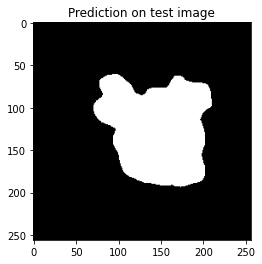

(1, 256, 256)
index:  57


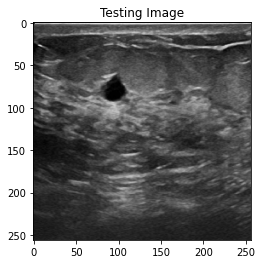

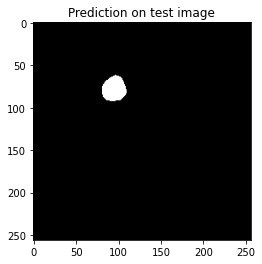

(1, 256, 256)
index:  58


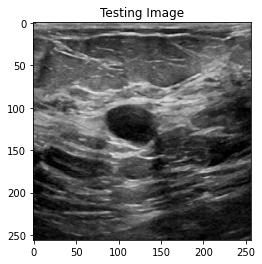

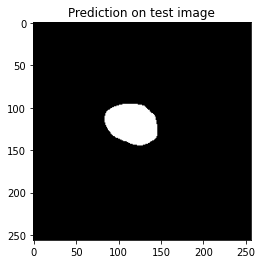

(1, 256, 256)
index:  59


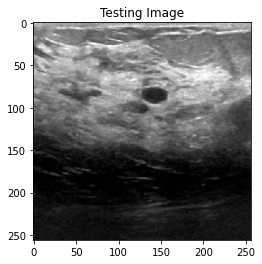

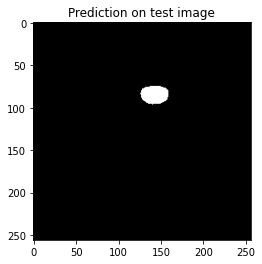

(1, 256, 256)
index:  60


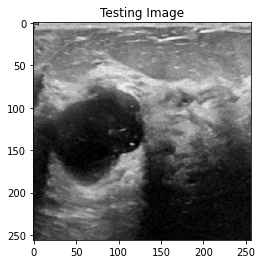

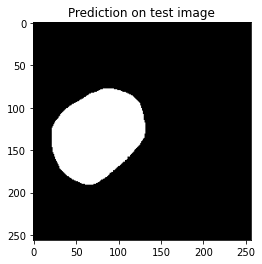

(1, 256, 256)
index:  61


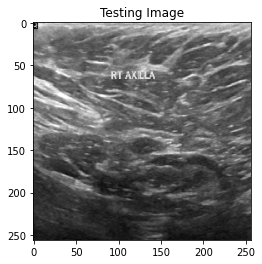

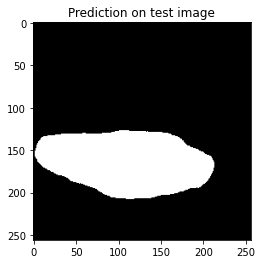

(1, 256, 256)
index:  62


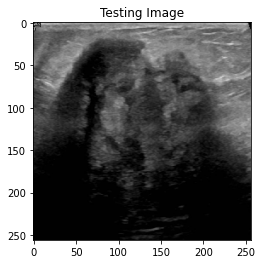

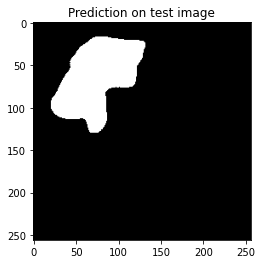

(1, 256, 256)
index:  63


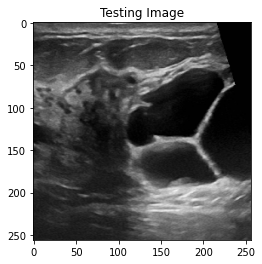

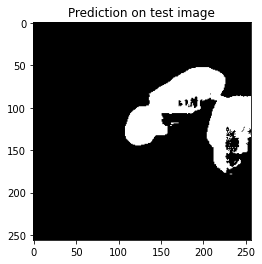

(1, 256, 256)
index:  64


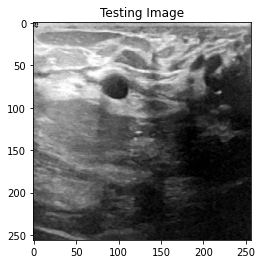

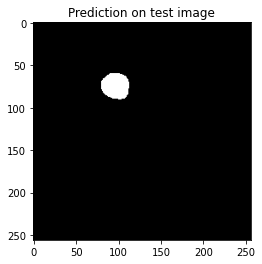

(1, 256, 256)
index:  65


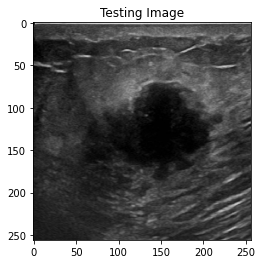

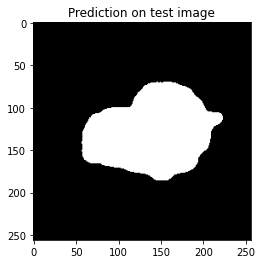

(1, 256, 256)
index:  66


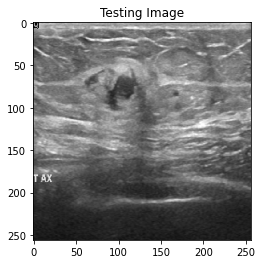

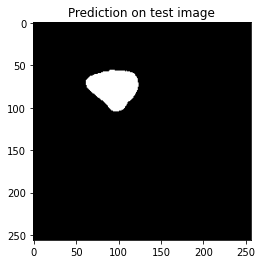

(1, 256, 256)
index:  67


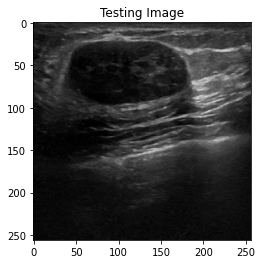

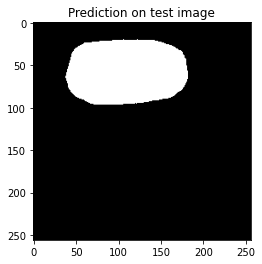

(1, 256, 256)
index:  68


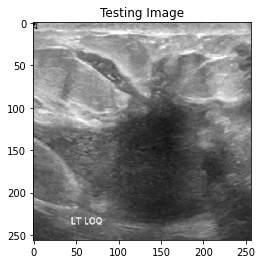

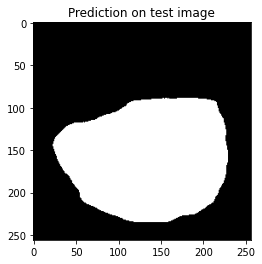

(1, 256, 256)
index:  69


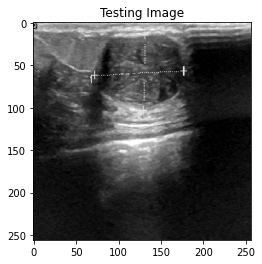

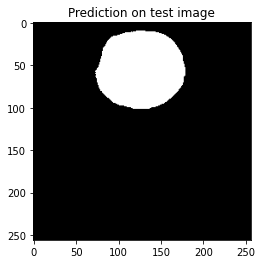

(1, 256, 256)
index:  70


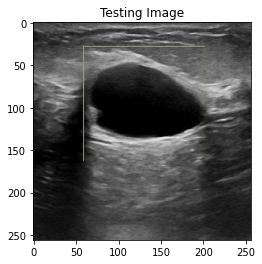

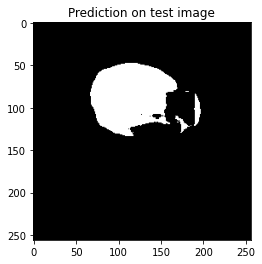

(1, 256, 256)
index:  71


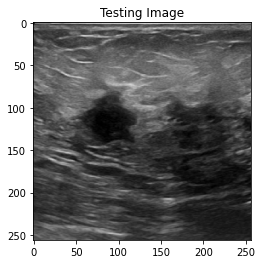

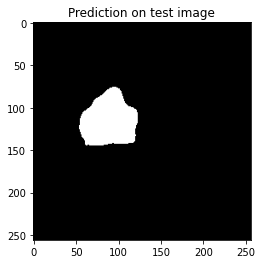

(1, 256, 256)
index:  72


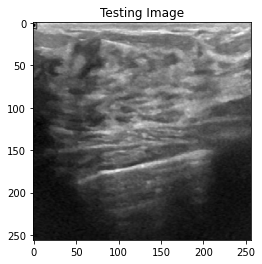

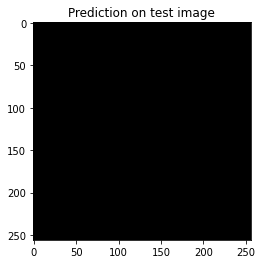

(1, 256, 256)
index:  73


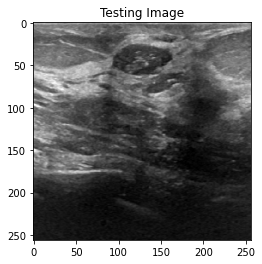

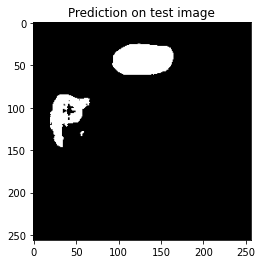

(1, 256, 256)
index:  74


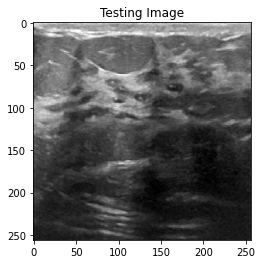

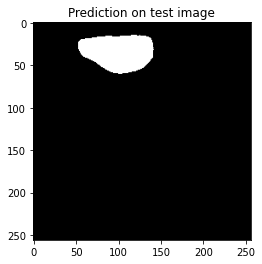

(1, 256, 256)
index:  75


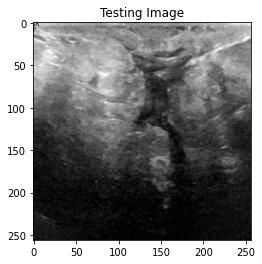

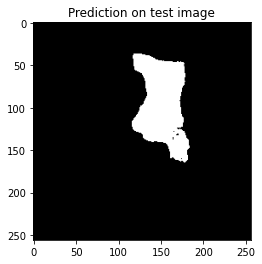

(1, 256, 256)
index:  76


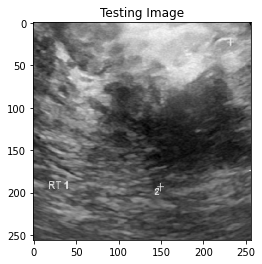

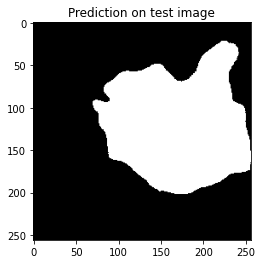

(1, 256, 256)
index:  77


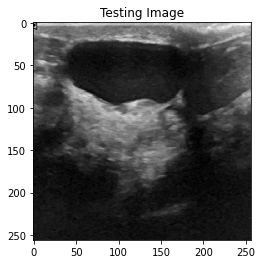

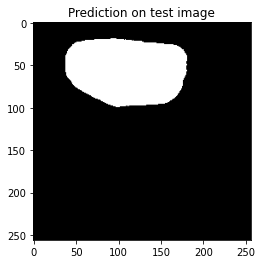

(1, 256, 256)
index:  78


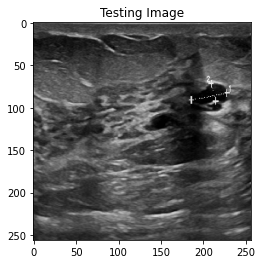

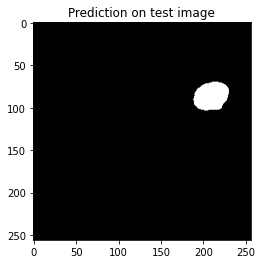

(1, 256, 256)
index:  79


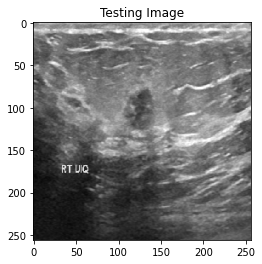

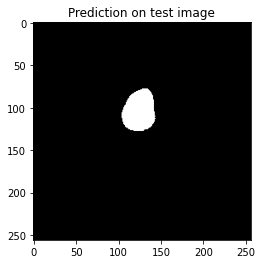

(1, 256, 256)
index:  80


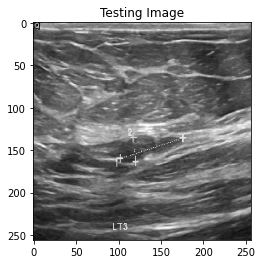

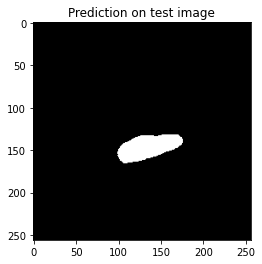

(1, 256, 256)
index:  81


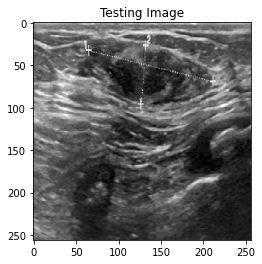

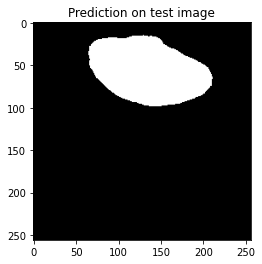

(1, 256, 256)
index:  82


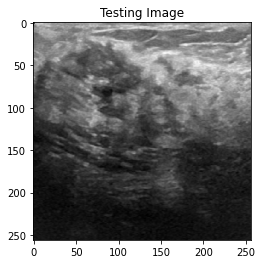

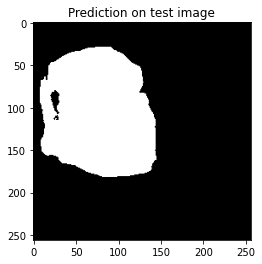

(1, 256, 256)
index:  83


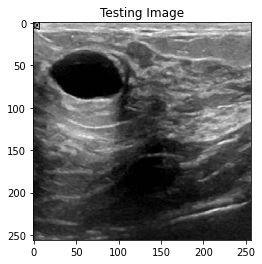

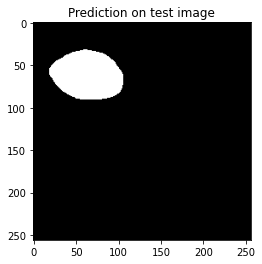

(1, 256, 256)
index:  84


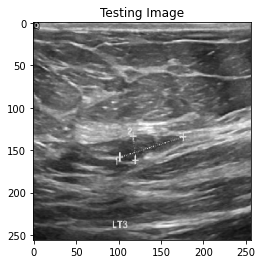

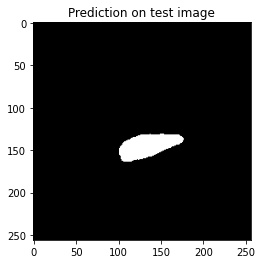

(1, 256, 256)
index:  85


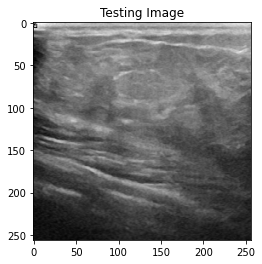

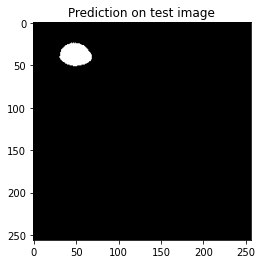

(1, 256, 256)
index:  86


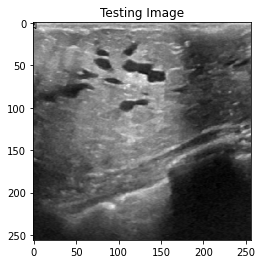

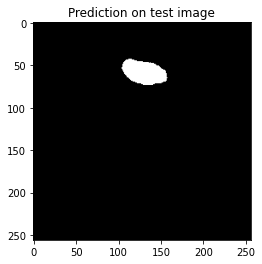

(1, 256, 256)
index:  87


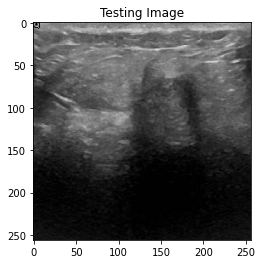

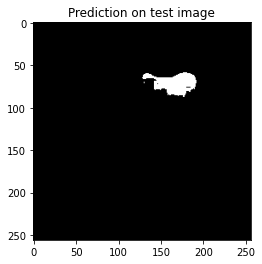

(1, 256, 256)
index:  88


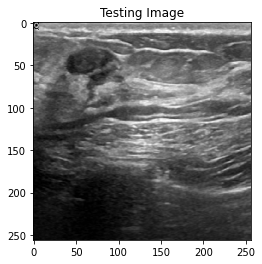

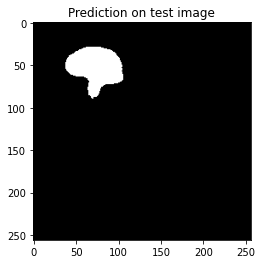

(1, 256, 256)
index:  89


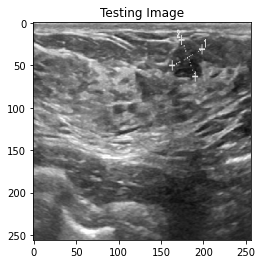

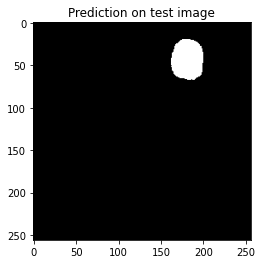

(1, 256, 256)
index:  90


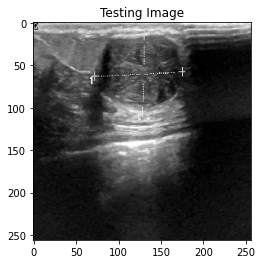

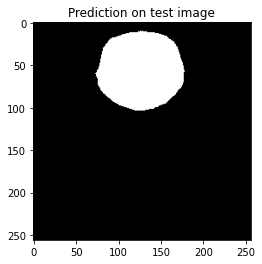

(1, 256, 256)
index:  91


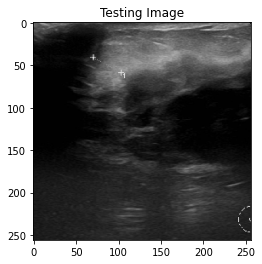

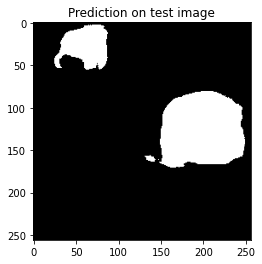

(1, 256, 256)
index:  92


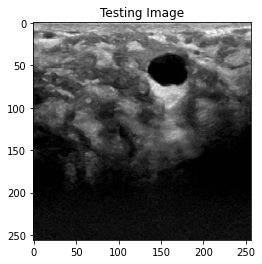

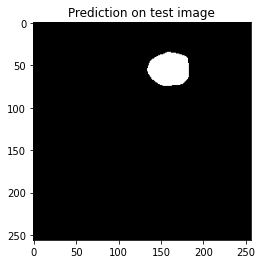

(1, 256, 256)
index:  93


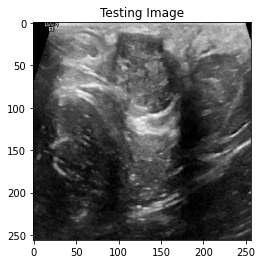

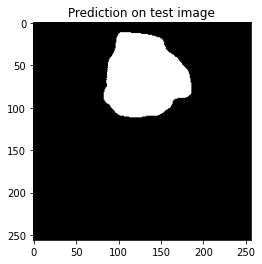

(1, 256, 256)
index:  94


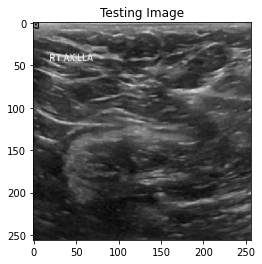

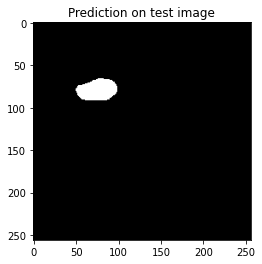

(1, 256, 256)
index:  95


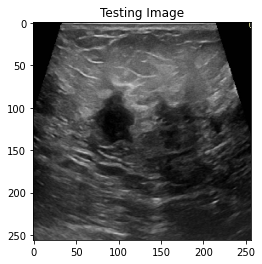

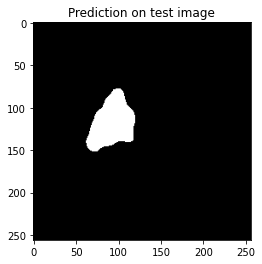

(1, 256, 256)
index:  96


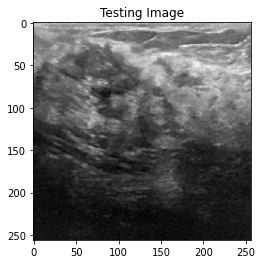

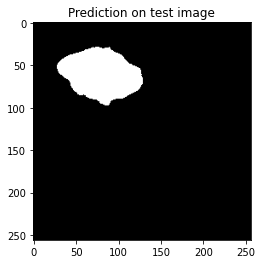

(1, 256, 256)
index:  97


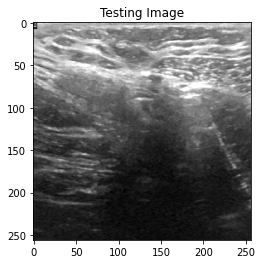

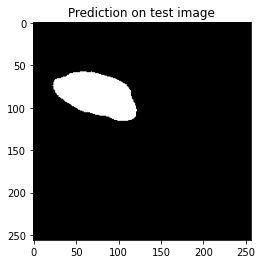

(1, 256, 256)
index:  98


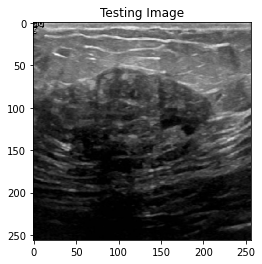

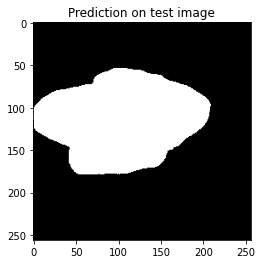

(1, 256, 256)
index:  99


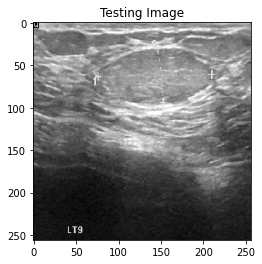

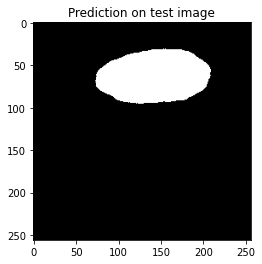

(1, 256, 256)
index:  100


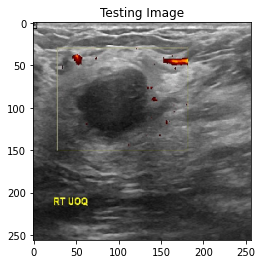

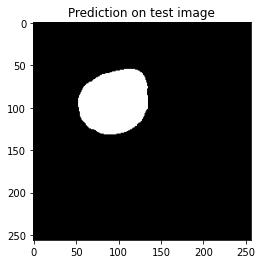

(1, 256, 256)
index:  101


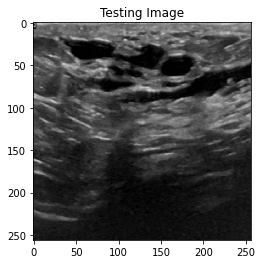

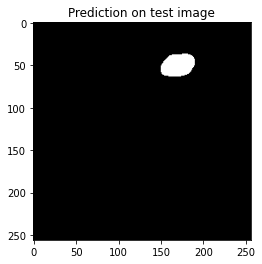

(1, 256, 256)
index:  102


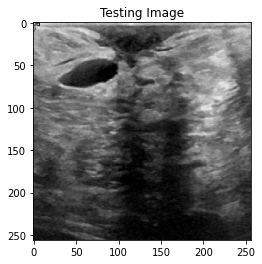

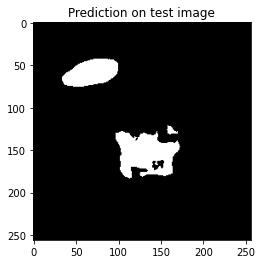

(1, 256, 256)
index:  103


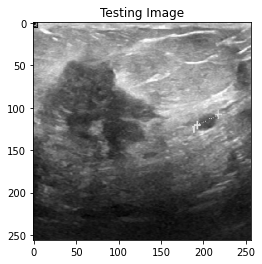

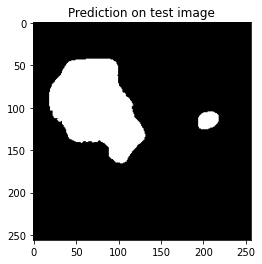

(1, 256, 256)
index:  104


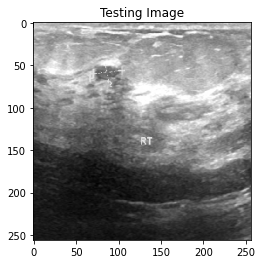

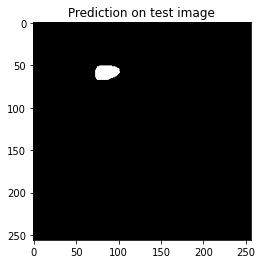

(1, 256, 256)
index:  105


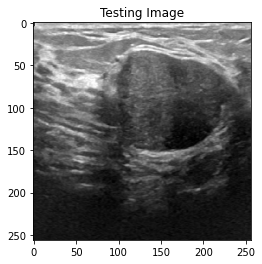

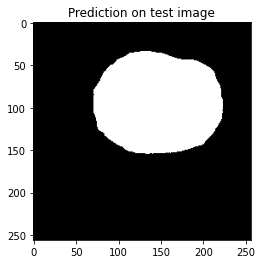

(1, 256, 256)
index:  106


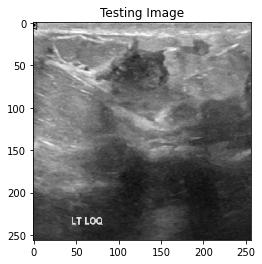

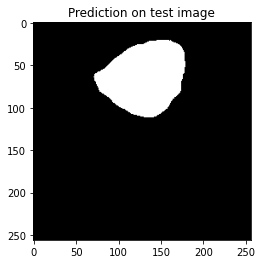

(1, 256, 256)
index:  107


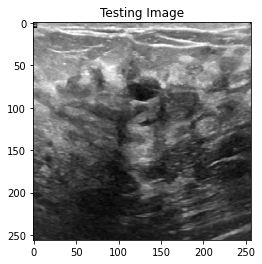

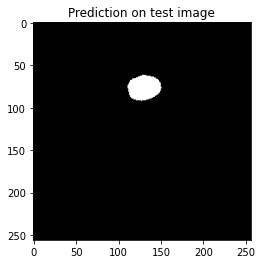

(1, 256, 256)
index:  108


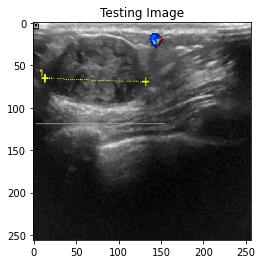

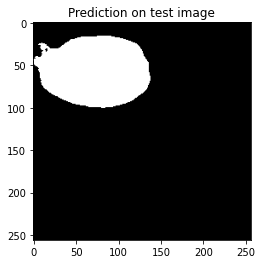

(1, 256, 256)
index:  109


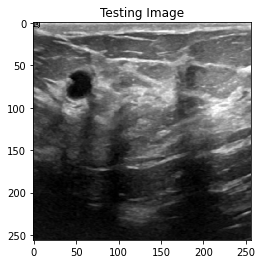

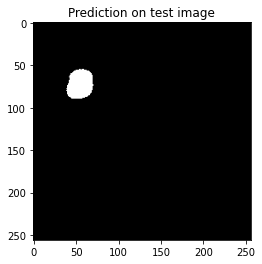

(1, 256, 256)
index:  110


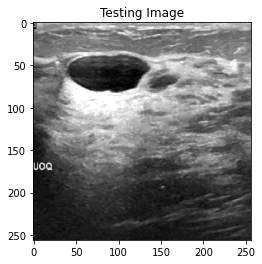

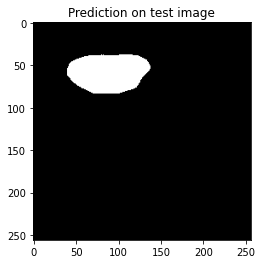

(1, 256, 256)
index:  111


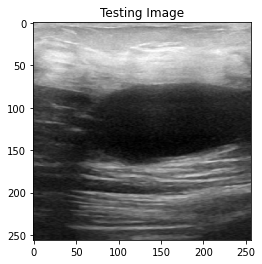

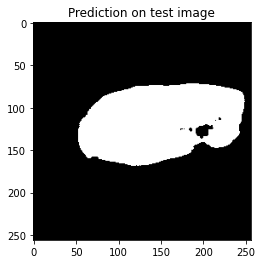

(1, 256, 256)
index:  112


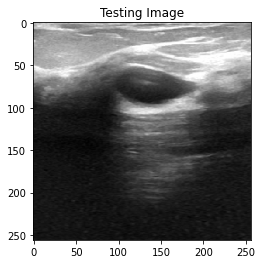

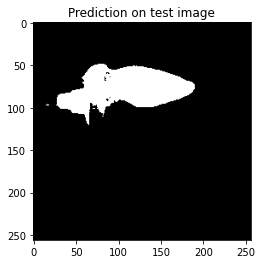

(1, 256, 256)
index:  113


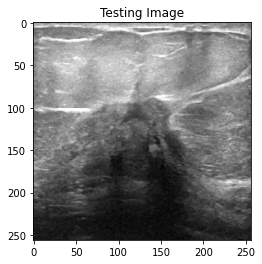

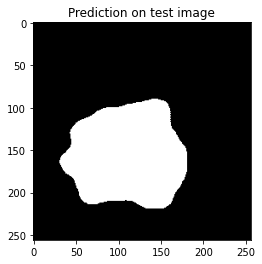

(1, 256, 256)
index:  114


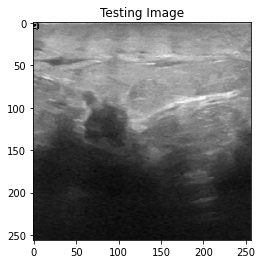

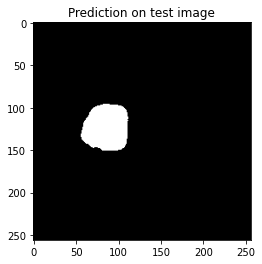

(1, 256, 256)
index:  115


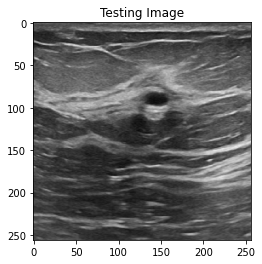

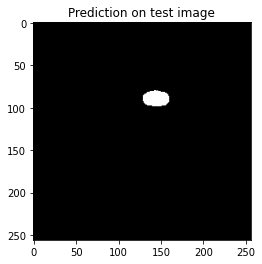

(1, 256, 256)
index:  116


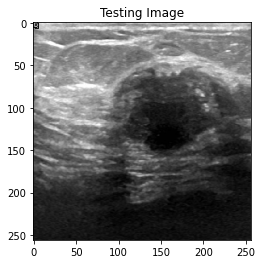

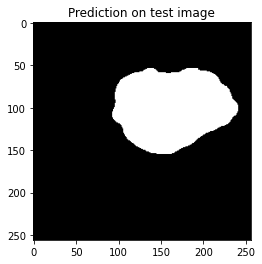

(1, 256, 256)
index:  117


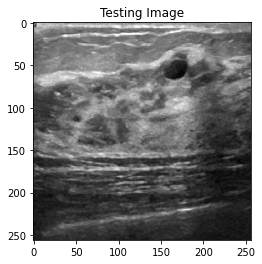

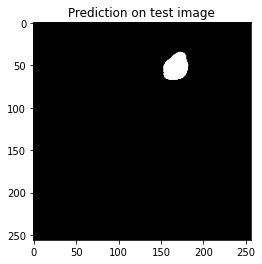

(1, 256, 256)
index:  118


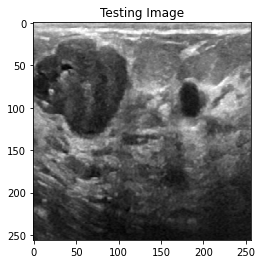

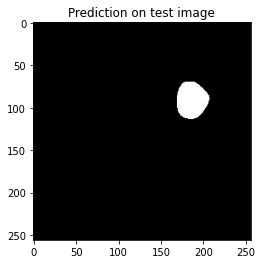

(1, 256, 256)
index:  119


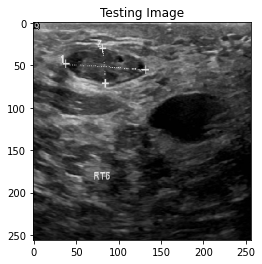

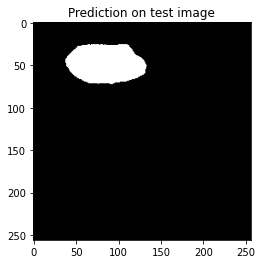

(1, 256, 256)
index:  120


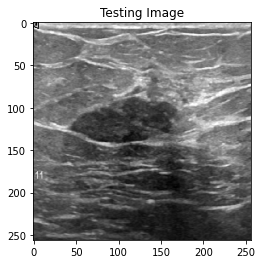

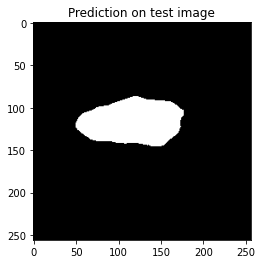

(1, 256, 256)
index:  121


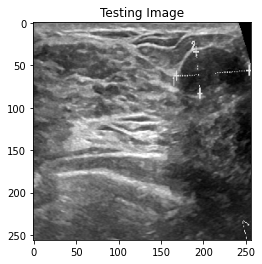

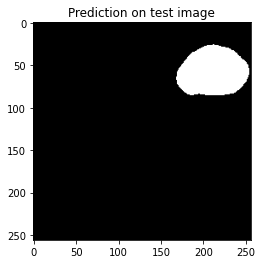

(1, 256, 256)
index:  122


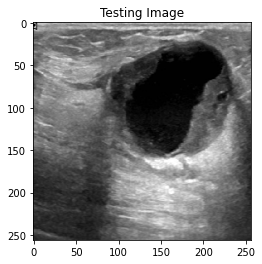

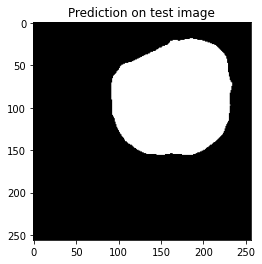

(1, 256, 256)
index:  123


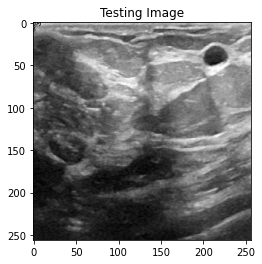

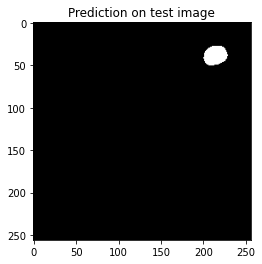

(1, 256, 256)
index:  124


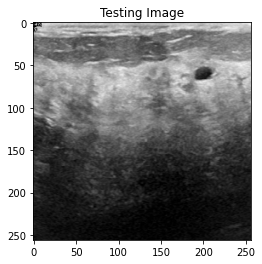

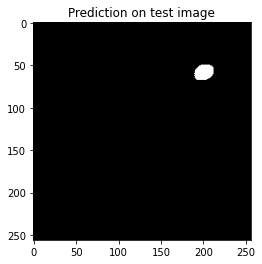

(1, 256, 256)
index:  125


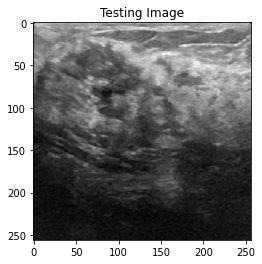

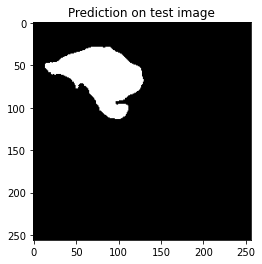

(1, 256, 256)
index:  126


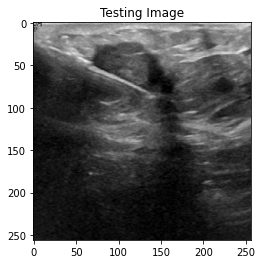

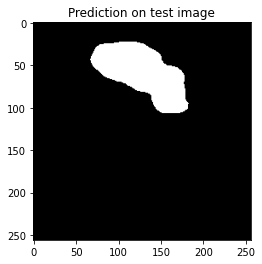

(1, 256, 256)
index:  127


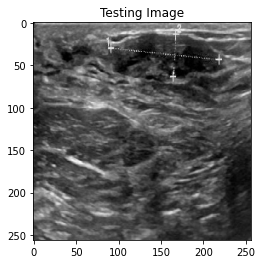

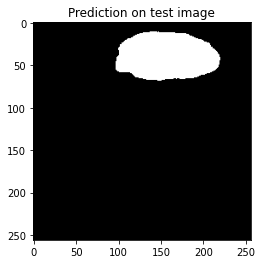

(1, 256, 256)
index:  128


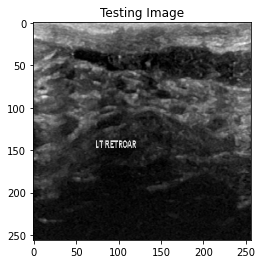

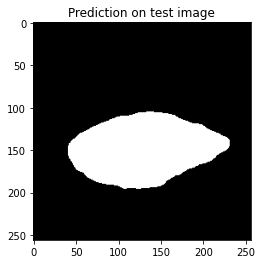

(1, 256, 256)
index:  129


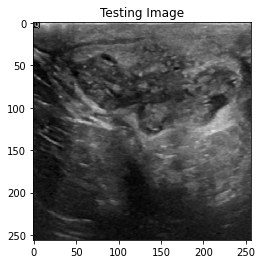

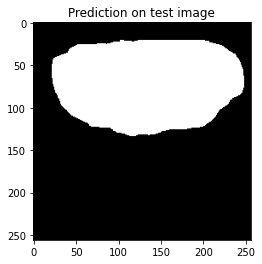

In [ ]:
#IOU
print(y_test.shape)
print(y_pred_argmax.shape)
# Using built in keras function
IOU_keras = MeanIoU(num_classes=n_classes)  
IOU_keras.update_state(y_test, y_pred_argmax)
print("Mean IoU =", IOU_keras.result().numpy())
# https://stackoverflow.com/questions/61433955/unknown-is-not-supported-f1-score
f1=0
for i in range(0, len(x_test)):
  f1 = f1 + f1_score(y_test[i].flatten(), y_pred_argmax[i].flatten())
print("F1 Score =", f1/(len(x_test)))
#To calculate I0U for each class...
values = np.array(IOU_keras.get_weights()).reshape(n_classes, n_classes)
print(values)

class1_IoU = values[0,0]/(values[0,0] + values[0,1] + values[1,0])
class2_IoU = values[1,1]/(values[1,1] + values[1,0] + values[0,1])

print("IoU for class1 is: ", class1_IoU)
print("IoU for class2 is: ", class2_IoU)

for i in range(0,len(x_test)):
  test_img = x_test[i]

  test_img_input=np.expand_dims(test_img, 0)
  prediction = model.predict(test_img_input)
  predicted_img=np.argmax(prediction, axis=3)
  # print("image name= ",test_image_name[i])
  print(predicted_img.shape)
  #print("shape of prediction= ",prediction.shape," predicted image after argmax= ",predicted_img.shape)
  print("index: ", i)
  # plt.figure(figsize=(12, 8))
  # plt.subplot(231)
  plt.title('Testing Image')
  plt.imshow(cv2.cvtColor(test_img, cv2.COLOR_BGR2RGB))

  plt.figure()
  plt.title('Prediction on test image')
  plt.imshow(predicted_img[0], cmap='gray')
  plt.show()